In [38]:
# ----- Packages -----
import pandas as pd
import PyWGCNA
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from matplotlib.colors import ListedColormap
import  numpy as np



In [9]:
# ----- Funciones -----

# Función para ver las predicciones en el grafo
# Chequea si las predicciones están en el grafo
# Devuelve un dataframe en el que dice la cantidad de ejemplos positivos y predicciones en cada módulo
def genes_por_modulo(grafo, genes_cadena, genes_118predichos):
    genes_modulos = pd.DataFrame(grafo.datExpr.var)
    modulos = genes_modulos['moduleColors'].unique()
    modulos2 = {}
    #para sumar el gen a cada uno de las variables de modulos2
    cont = 0
    for genes_str in modulos:
        df = genes_modulos[genes_modulos['moduleColors'] == genes_str]
        df_genes = df.index.values.tolist()
        modulos2[genes_str] = df_genes
        cont +=1
    modules = grafo.datExpr.var.moduleColors.unique().tolist()
    module_colors = pd.DataFrame(genes_modulos['moduleColors'])
    analisis_network = pd.DataFrame(data=0, index=['Total de genes', 'Ejemplos positivos', 'Predicciones'] , columns = modules)
    for modulo in modulos2:
        analisis_network.loc['Total de genes', modulo] += len(modulos2[modulo])
    
    genes_cadena_presentes = len(genes_cadena)
    for gen_interes in genes_cadena: 
        try:
            modulo = module_colors.loc[gen_interes, 'moduleColors']
            analisis_network.loc['Ejemplos positivos', modulo] +=1

        except:
            print('El gen', gen_interes, '(de los Ejemplos positivos) no está en el grafo')
            genes_cadena_presentes -= 1

    for gen_interes in genes_118predichos: 
        try:
            modulo = module_colors.loc[gen_interes, 'moduleColors']
            analisis_network.loc['Predicciones', modulo] +=1

        except:
            print('El gen', gen_interes, '(de predichos) no está en el grafo')

    return analisis_network.T, genes_cadena_presentes   

In [1]:
# Nombre del archivo de texto que contiene la lista
nombre_archivo = r"..\Archivos\interseccion_ds_todos.txt"

# Lista donde se almacenarán los elementos leídos del archivo
predichos = []

# Abre el archivo en modo de lectura
with open(nombre_archivo, 'r') as archivo:
    # Lee cada línea del archivo
    for linea in archivo:
        # Elimina el carácter de nueva línea al final de la línea y agrega el elemento a la lista
        predichos.append(linea.strip())

# Mapear las predicciones de la lista consenso al grafo

In [4]:
# Cargar muestra positiva
genes = pd.read_csv(r"..\Archivos\Genes_cadena.csv")
# Filtrar el DataFrame para seleccionar las filas que cumplan la condición
filas_seleccionadas = genes[genes['Usar para entrenar'] == 'si']
# Obtener los valores de la columna 'WBID' para las filas seleccionadas
muestra_positiva = filas_seleccionadas['WBID'].tolist()

In [1]:
grafo = PyWGCNA.readWGCNA(r"\Archivos\Grafo_co-expresion\grafo_sin_sacar_0s.p")


NameError: name 'PyWGCNA' is not defined

In [10]:
df_ss0, genes_cadena_ss0 = genes_por_modulo(grafo, muestra_positiva, predichos)


El gen WBGene00014454 (de predichos) no está en el grafo


In [12]:
df_ss0.sort_values(by='Ejemplos positivos', ascending=False)

,Total de genes,Ejemplos positivos,Predicciones
coral,718,48,24
brown,1687,8,3
whitesmoke,960,4,13
snow,597,2,6
lightcoral,1704,1,18
chocolate,630,1,4
darkorange,867,1,2
yellowgreen,135,1,1
lightsalmon,655,1,1
silver,842,1,8


In [15]:
# Nos quedamos con los genes que componen cada módulo (nombrados como colores, como lo da pyWGCNA)
mat_adj = grafo.adjacency
df = pd.DataFrame(grafo.datExpr.var)

# Initialize an empty dictionary to store the results
color_dict = {}

# Iterate through the DataFrame to populate the dictionary
for index, row in df.iterrows():
    color = row['moduleColors']
    if color in color_dict:
        color_dict[color].append(index)
    else:
        color_dict[color] = [index]

In [19]:
# De la matriz de adyacencia del grafo, nos quedamos con los nodos que correponden los genes del cluster A
coral = color_dict['coral'] # coral == cluster A
coral_subset = mat_adj.loc[mat_adj.index.isin(coral), coral]


In [20]:
coral_subset

,WBGene00010965,WBGene00010960,WBGene00010959,WBGene00000829,WBGene00010957,WBGene00010962,WBGene00010964,WBGene00010967,WBGene00013463,WBGene00022336,...,WBGene00012631,WBGene00017959,WBGene00008009,WBGene00016434,WBGene00016712,WBGene00016692,WBGene00006084,WBGene00006656,WBGene00045270,WBGene00007406
WBGene00010965,0.000000e+00,0.157132,0.278947,0.300186,0.513722,0.230641,0.447895,0.112044,0.049947,0.014934,...,7.121796e-09,3.991655e-08,1.111915e-05,0.0,0.0,0.000446,0.000446,3.991655e-08,0.0,0.000013
WBGene00010960,1.571317e-01,0.000000,0.458649,0.341686,0.410599,0.600063,0.300550,0.084255,0.008292,0.060880,...,0.000000e+00,2.777130e-04,0.000000e+00,0.0,0.0,0.000018,0.000018,2.777130e-04,0.0,0.000591
WBGene00010959,2.789470e-01,0.458649,0.000000,0.551085,0.511790,0.350142,0.447556,0.310782,0.049606,0.034046,...,3.593106e-08,1.207080e-04,1.610637e-07,0.0,0.0,0.000068,0.000068,1.207080e-04,0.0,0.000263
WBGene00000829,3.001864e-01,0.341686,0.551085,0.000000,0.610154,0.335840,0.584351,0.343865,0.050514,0.033209,...,2.297853e-06,1.125509e-05,0.000000e+00,0.0,0.0,0.000013,0.000013,1.125509e-05,0.0,0.000557
WBGene00010957,5.137224e-01,0.410599,0.511790,0.610154,0.000000,0.537234,0.625325,0.241404,0.033780,0.016325,...,2.836666e-07,0.000000e+00,0.000000e+00,0.0,0.0,0.000084,0.000084,0.000000e+00,0.0,0.000175
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WBGene00016692,4.461307e-04,0.000018,0.000068,0.000013,0.000084,0.000098,0.000713,0.000009,0.001169,0.004838,...,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,0.000000,1.000000,0.000000e+00,0.0,0.000000
WBGene00006084,4.461307e-04,0.000018,0.000068,0.000013,0.000084,0.000098,0.000713,0.000009,0.001169,0.004838,...,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.0,1.000000,0.000000,0.000000e+00,0.0,0.000000
WBGene00006656,3.991655e-08,0.000278,0.000121,0.000011,0.000000,0.000000,0.000009,0.000000,0.000382,0.000272,...,0.000000e+00,1.000000e+00,0.000000e+00,0.0,0.0,0.000000,0.000000,0.000000e+00,0.0,0.000000
WBGene00045270,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000132,0.002110,...,0.000000e+00,0.000000e+00,0.000000e+00,1.0,1.0,0.000000,0.000000,0.000000e+00,0.0,0.000000


In [22]:
hub_coral = pd.read_csv(r"..\Archivos\Grafo_co-expresion\20hubgenes_coral.csv")


In [23]:
df_nodos_labels = pd.DataFrame()

## Ploteamos el cluster A

Versión 1

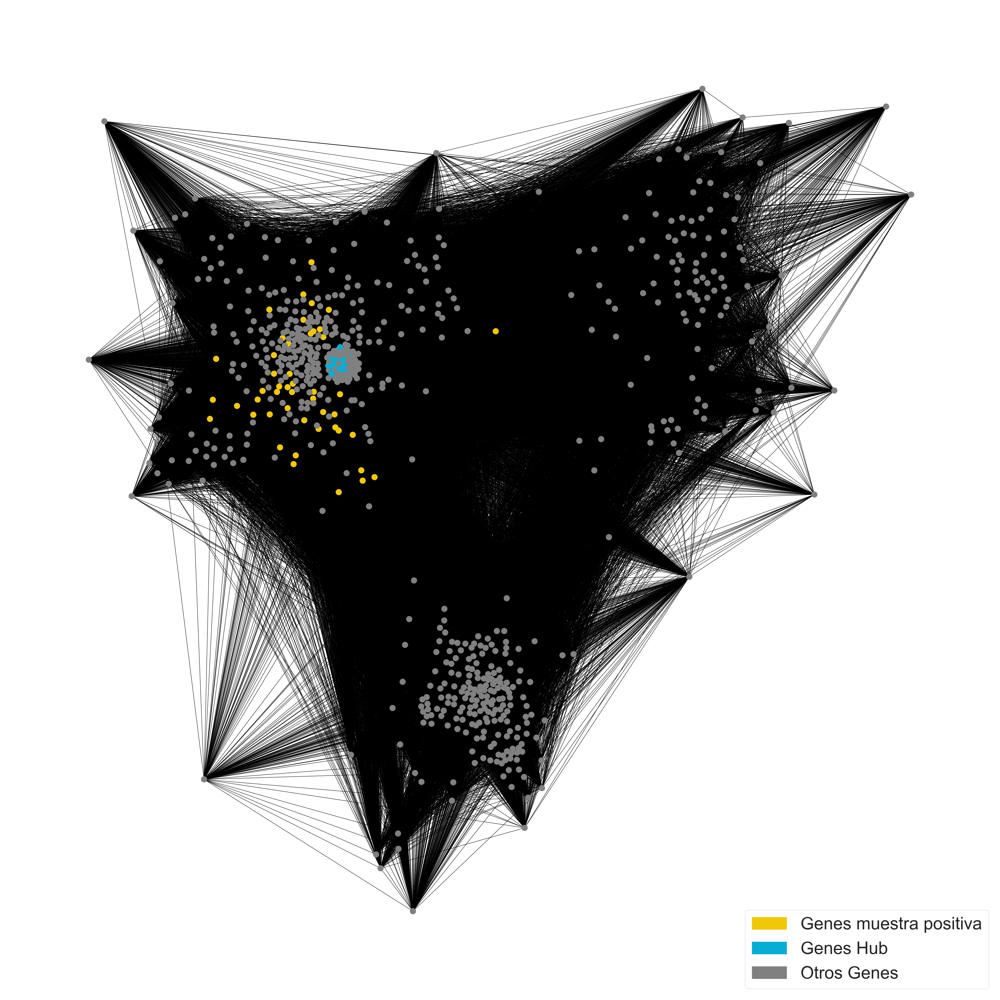

In [25]:
# Creamos un DataFrame con los valores de los genes y sus etiquetas
data = {
    'WBGeneID': ['WBGene00000210', 'WBGene00015755', 'WBGene00017926', 'WBGene00009739', 'WBGene00017982', 'WBGene00018151', 'WBGene00007684', 'WBGene00018963', 'WBGene00019007', 'WBGene00004444', 'WBGene00004453', 'WBGene00004497', 'WBGene00004498'],
    'Etiqueta': ['asg-2', 'C14B9.10', 'cox-6C', 'F45H10.2', 'hpo-18', 'ndab-2', 'ndub-3', 'ucr-1', 'ucr-11', 'rpl-30', 'rpl-39', 'rps-28', 'rps-29']
}

df_etiquetas = pd.DataFrame(data)

# Creamos el grafo a partir del DataFrame
G = nx.from_pandas_adjacency(coral_subset)

# Creamos un diccionario que asocie cada nodo con su respectiva etiqueta
etiquetas_dict = dict(zip(df_etiquetas['WBGeneID'], df_etiquetas['Etiqueta']))

# Creamos un diccionario para asignar colores a los nodos según tus criterios
colores_dict = {
    gene: '#F0C808' if gene in muestra_positiva else
           '#06AED5' if gene in list(hub_coral['WBID']) else
           'gray' for gene in G.nodes
}

# Creamos la disposición de los nodos
pos = nx.spring_layout(G, k=0.1, seed = 42)

# Dibujamos el grafo con diferentes colores y etiquetas
plt.figure(figsize=(40, 40))
nx.draw(G, pos, with_labels=False, node_color=list(colores_dict.values()), node_size=300, linewidths=0.5)

# Dibujamos las etiquetas de los nodos
# nx.draw_networkx_labels(G, pos, labels=etiquetas_dict, font_size=20, font_color='white',  font_weight='bold')

# Creamos la leyenda
legend_labels = ['Genes muestra positiva', 'Genes Hub', 'Otros Genes']
legend_colors = ['#F0C808', '#06AED5', 'gray']
legend_patches = [mpatches.Patch(color=color, label=label) for label, color in zip(legend_labels, legend_colors)]
plt.legend(handles=legend_patches, loc='lower right', fontsize=50, handlelength=2.0)

# Mostramos el grafo
plt.axis('off')
plt.show()

Versión 2

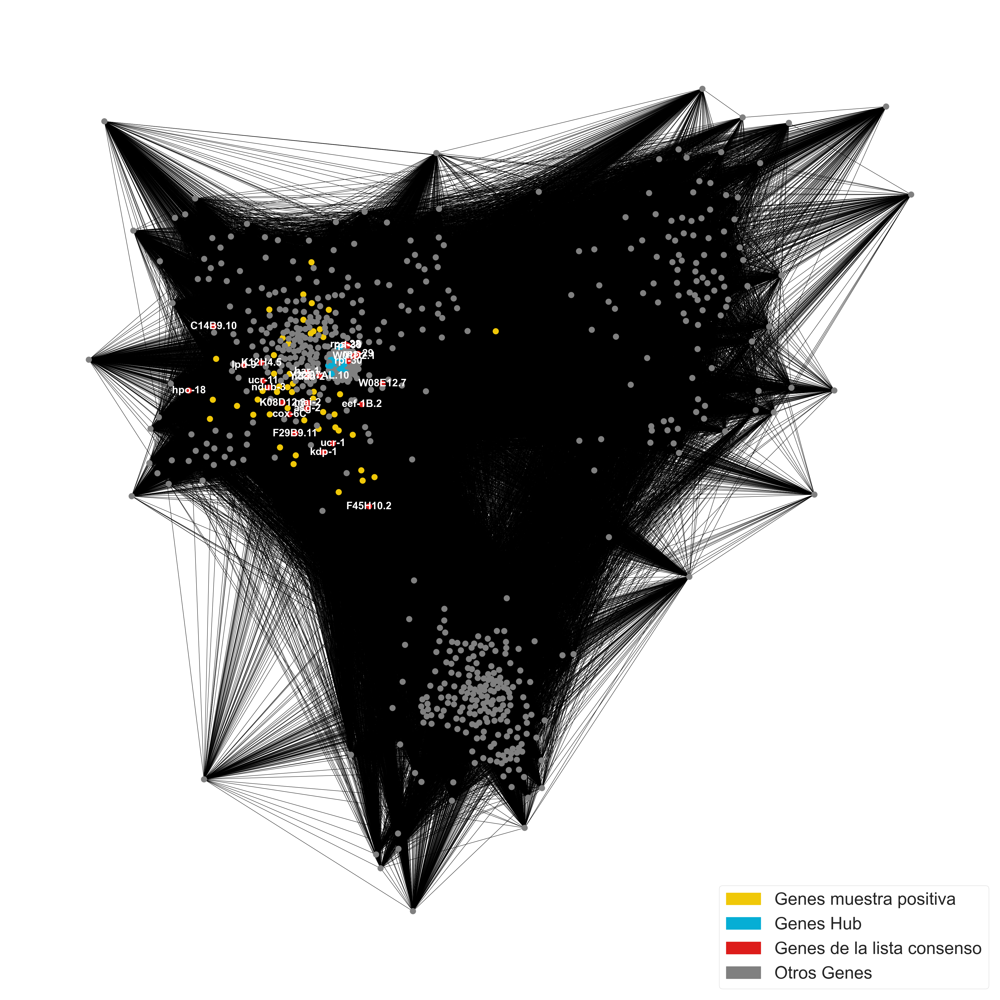

In [26]:
# Creamos un DataFrame con los valores de los genes y sus etiquetas
data = {
    'WBGeneID': ['WBGene00000210', 'WBGene00015755', 'WBGene00017926', 'WBGene00009739', 
                 'WBGene00017982', 'WBGene00018151', 'WBGene00007684', 'WBGene00018963', 
                 'WBGene00019007', 'WBGene00004444', 'WBGene00004453', 'WBGene00004497', 
                 'WBGene00004498', 'WBGene00012179'],
    'Etiqueta': ['asg-2', 'C14B9.10', 'cox-6C', 'F45H10.2', 'hpo-18', 'ndab-2', 'ndub-3', 
                 'ucr-1', 'ucr-11', 'rpl-30', 'rpl-39', 'rps-28', 'rps-29', 'W01D2.1']
}

data = {
    'WBGeneID': ['WBGene00017926',
'WBGene00017925',
'WBGene00019680',
'WBGene00013463',
'WBGene00003065',
'WBGene00019007',
'WBGene00017982',
'WBGene00015248',
'WBGene00000210',
'WBGene00007630',
'WBGene00012768',
'WBGene00021248',
'WBGene00018151',
'WBGene00007684',
'WBGene00021088',
'WBGene00004444',
'WBGene00012179',
'WBGene00004453',
'WBGene00004497',
'WBGene00004498',
'WBGene00015755',
'WBGene00018963',
'WBGene00009739',
'WBGene00019537' 
    ],
    'Etiqueta': ['cox-6C',
'F29B9.11',
'K12H4.5',
'kdp-1',
'lpd-9',
'ucr-11',
'hpo-18',
'mai-2',
'asg-2',
'har-1',
'eef-1B.2',
'Y22D7AL.10',
'ndab-2',
'ndub-3',
'W08E12.7',
'rpl-30',
'W01D2.1',
'rpl-39',
'rps-28',
'rps-29',
'C14B9.10',
'ucr-1',
'F45H10.2',
'K08D12.3'
]
}



df_etiquetas = pd.DataFrame(data)

# Creamos el grafo a partir del DataFrame
G = nx.from_pandas_adjacency(coral_subset)

# Creamos un diccionario que asocie cada nodo con su respectiva etiqueta
etiquetas_dict = dict(zip(df_etiquetas['WBGeneID'], df_etiquetas['Etiqueta']))

# Creamos un diccionario para asignar colores a los nodos según tus criterios
colores_dict = {
    gene: '#F0C808' if gene in muestra_positiva else
           '#06AED5' if gene in list(hub_coral['WBID']) else
#            'purple' if gene in duplicados else
           '#DD1C1A' if gene in predichos else 
           'gray' for gene in G.nodes
}

# Creamos la disposición de los nodos
pos = nx.spring_layout(G, k=0.1, seed = 42)

# Dibujamos el grafo con diferentes colores y etiquetas
plt.figure(figsize=(40, 40))
nx.draw(G, pos, with_labels=False, node_color=list(colores_dict.values()), node_size=300, linewidths=0.5)

# Dibujamos las etiquetas de los nodos
nx.draw_networkx_labels(G, pos, labels=etiquetas_dict, font_size=30, font_color='white',  font_weight='bold')

# Creamos la leyenda
legend_labels = ['Genes muestra positiva', 'Genes Hub', 'Genes de la lista consenso', 'Otros Genes']
legend_colors = ['#F0C808', '#06AED5', '#DD1C1A', 'gray']
legend_patches = [mpatches.Patch(color=color, label=label) for label, color in zip(legend_labels, legend_colors)]
plt.legend(handles=legend_patches, loc='lower right', fontsize=50, handlelength=2.0)

# Mostramos el grafo
plt.axis('off')
plt.show()


In [16]:
ccts = ['WBGene00000377',
        'WBGene00000378',
        'WBGene00018782',
        'WBGene00000379',
        'WBGene00000380',
        'WBGene00000381',
        'WBGene00020391',
        'WBGene00021934'
       ]

In [71]:
predichos_coral = list(set(coral).intersection(predichos))

In [74]:
predichos_coral 

['WBGene00004497',
 'WBGene00017926',
 'WBGene00007630',
 'WBGene00007684',
 'WBGene00018151',
 'WBGene00015755',
 'WBGene00019680',
 'WBGene00004453',
 'WBGene00021248',
 'WBGene00013463',
 'WBGene00021088',
 'WBGene00000210',
 'WBGene00015248',
 'WBGene00019007',
 'WBGene00017982',
 'WBGene00004498',
 'WBGene00004444',
 'WBGene00009739',
 'WBGene00003065',
 'WBGene00017925',
 'WBGene00018963',
 'WBGene00012768',
 'WBGene00019537',
 'WBGene00012179']

# Figura 16 - Gráfico de barras con cantidad de genes y enriquecimiento de genes predichos en cada cluster

In [45]:
enriquecimiento = pd.read_csv(r'..\Archivos\Grafo_co-expresion\Enriquecimiento de genes predichos en el grafo.csv', index_col=0)

In [46]:
enriquecimiento

,Total de genes,Genes predichos,Fold change,p-value
lightcoral,1704,18,1.757249,0.000000e+00
coral,718,24,5.560544,0.000000e+00
snow,597,6,1.671889,8.930247e-251
whitesmoke,960,13,2.252696,0.000000e+00
silver,842,8,1.580551,0.000000e+00
sienna,180,7,6.469281,3.489064e-67
lightsalmon,655,1,0.253974,5.434315e-288
darkseagreen,75,1,2.218039,1.731520e-31
blanchedalmond,114,0,0.000000,2.105545e-50
darkred,483,4,1.377664,3.994463e-204


In [36]:
clusters = ['gainsboro', 'darkorange', 'indianred', 'mistyrose', 'red', 'olive', 'rosybrown', 'bisque', 
           'firebrick', 'chocolate', 'oldlace', 'coral', 'sandybrown', 'tomato', 'lightgoldenrodyellow', 
           'white', 'sienna', 'saddlebrown', 'papayawhip', 'darkgrey', 'blanchedalmond', 'wheat', 'olivedrab',
           'yellow', 'gold', 'lightyellow', 'lawngreen', 'floralwhite', 'beige', 'antiquewhite', 'ivory', 
           'tan', 'darksalmon', 'darkred', 'darkkhaki', 'palegreen', 'linen', 'khaki', 'darkolivegreen', 
           'peachpuff', 'goldenrod', 'navajowhite', 'maroon', 'black', 'honeydew', 'yellowgreen', 'darkgoldenrod',
           'burlywood', 'cornsilk', 'whitesmoke', 'snow', 'moccasin', 'palegoldenrod', 'chartreuse', 'salmon',
           'dimgrey', 'lightgrey', 'peru', 'darkseagreen', 'lemonchiffon', 'brown', 'seashell', 'greenyellow',
           'orangered', 'lightsalmon', 'orange', 'lightcoral', 'silver']


In [32]:
#Crear paleta de colores
palette = sns.color_palette(["#D0D0D0","#D0D0D0", "#A8B691", "#738651", '#487047',
                             "#3A5A40", "#344E41"])
palette

[(0.8156862745098039, 0.8156862745098039, 0.8156862745098039),
 (0.8156862745098039, 0.8156862745098039, 0.8156862745098039),
 (0.6588235294117647, 0.7137254901960784, 0.5686274509803921),
 (0.45098039215686275, 0.5254901960784314, 0.3176470588235294),
 (0.2823529411764706, 0.4392156862745098, 0.2784313725490196),
 (0.22745098039215686, 0.35294117647058826, 0.25098039215686274),
 (0.20392156862745098, 0.3058823529411765, 0.2549019607843137)]

68


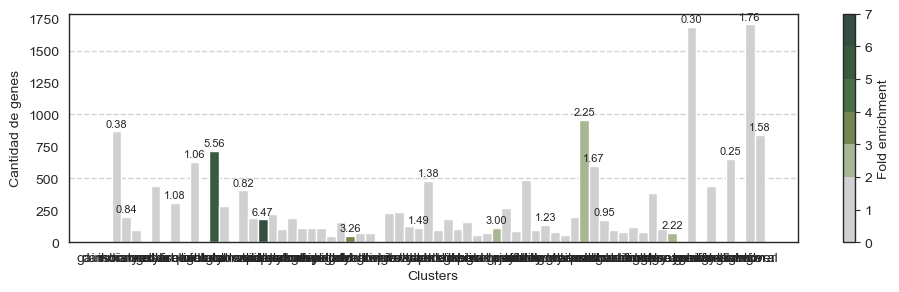

In [47]:
#Creamos el gráfico de barras con la cantidad de genes y enriquecimiento en el grafo
total_genes = []
for i in clusters:
    try:
        total_genes.append(df_ss0.loc[i, 'Total de genes'])
    except: 
#         print(i)
        total_genes.append(0)
num = np.arange(0, len(total_genes),1)
print(len(num))
# Create a bar plot
# Calculate the height of each bar
bar_height = 1

# Crear un rango de valores de cadena de mínimo a máximo para los clusters de interés
min_cadena_interest = enriquecimiento['Fold change'].min()
max_cadena_interest = enriquecimiento['Fold change'].max()


# Crear una horizontal bar plot
plt.figure(figsize=(10, 3))

for idx, cluster in enumerate(clusters):
    try:
        cadena_value = enriquecimiento.loc[cluster, 'Fold change'] 
            
        if cadena_value != 0:
            normalized_cadena = (cadena_value - min_cadena_interest) / (max_cadena_interest - min_cadena_interest)
            color = palette[int(normalized_cadena * (len(palette) -1))]
        
            plt.text(cluster, total_genes[idx] + 20, f"{cadena_value:.2f}", ha='center', va='bottom', fontsize=8)
        
        else:
            color = '#D0D0D0'
        
        # Crear la barra con el color adecuado y el valor de "Fold change" encima
        plt.bar(cluster, total_genes[idx], color=color, width=1)
        
    except: 
#         color = 'lightgray'
        plt.bar(cluster, total_genes[idx], color=color, width=1)  # Crear la barra con el color adecuado
#             pass

plt.xlabel('Clusters')
plt.ylabel('Cantidad de genes')
# plt.title('Total Genes per Cluster')
plt.axhline(y=1500, color='lightgray', linestyle='--', linewidth=1, zorder=0)
plt.axhline(y=1000, color='lightgray', linestyle='--', linewidth=1, zorder=0)
plt.axhline(y=500, color='lightgray', linestyle='--', linewidth=1, zorder=0)
plt.tight_layout()

# Crear una paleta de colores a partir de la lista personalizada
custom_cmap = ListedColormap(palette)

# Crear el objeto ScalarMappable con la paleta personalizada
sm = plt.cm.ScalarMappable(cmap=custom_cmap, norm=plt.Normalize(vmin=min_cadena_interest, vmax=7))
sm.set_array([])  # Dummy array to trick the color bar

# Agregar la barra de colores al gráfico
plt.colorbar(sm, label='Fold enrichment')

# Ajustar las posiciones del eje y para el centro de cada barra
# plt.gca().set_yticks([i + bar_height / 2 for i, _ in enumerate(clusters)])
# plt.gca().invert_yaxis()  # Invertir el eje y para que el clúster superior esté en la parte superior

plt.show()

In [40]:
#Hacemos un dataframe los genes de cada cluster que tiene un enriquecimiento en genes predichos mayor a 2
df_clusters_pred = pd.DataFrame(columns=['Genes', 'Cluster'])

for i in enriquecimiento.index:
    if enriquecimiento.loc[i, 'Fold change'] > 2:
        print(i)
        genes_modulo = color_dict[i]
        predichos_nuevo = list(set(genes_modulo).intersection(predichos))
        globals()["predichos_" + str(i)] = predichos_nuevo
        df_temp = pd.DataFrame({'Genes': genes_modulo, 'Cluster': i})
        df_clusters_pred = pd.concat([df_clusters_pred, df_temp], ignore_index=True)


coral
whitesmoke
sienna
darkseagreen
goldenrod
lightyellow


In [37]:
# df_clusters_pred.to_csv(r'..\Archivos\Grafo_co-expresion\genes_clusters_A-E.csv')

In [48]:
clusters_interes = {'Cluster de interés': 'coral',
                    'A': 'sienna',  
                    'B': 'lightyellow', 
                    'C': 'goldenrod',
                    'D':'whitesmoke', 
                    'E': 'darkseagreen'}

In [52]:
# Crear un nuevo DataFrame con las claves de clusters_interes como índices
nuevo_df = pd.DataFrame(index=clusters_interes.keys())
    
# Crear una columna 'Cantidad de genes predichos' en el nuevo DataFrame y llenarla con los valores correspondientes de df_ss0
for key, value in clusters_interes.items():
    nuevo_df.loc[key,'Total de genes'] = df_ss0.loc[value,'Total de genes']
    nuevo_df.loc[key,'Ejemplos positivos'] = df_ss0.loc[value,'Ejemplos positivos']
    nuevo_df.loc[key,'Genes predichos'] = df_ss0.loc[value,'Predicciones']
    
# Calcular la cantidad de genes que no están en ninguno de los clusters de interés y agregar una fila 'Otro'
nuevo_df.loc['Otros', 'Genes predichos'] = df_ss0['Predicciones'].sum() - nuevo_df['Genes predichos'].sum()
nuevo_df.loc['Otros', 'Ejemplos positivos'] = df_ss0['Ejemplos positivos'].sum() - nuevo_df['Ejemplos positivos'].sum()
nuevo_df.loc['Otros', 'Total de genes'] = df_ss0['Total de genes'].sum() - nuevo_df['Total de genes'].sum()

nuevo_df

# nuevo_df.to_csv('Cantidad de genes en cada cluster - para tabla.csv')

,Total de genes,Ejemplos positivos,Genes predichos
Cluster de interés,718.0,48.0,24.0
A,180.0,0.0,7.0
B,51.0,0.0,1.0
C,111.0,0.0,2.0
D,960.0,4.0,13.0
E,75.0,0.0,1.0
Otros,14873.0,16.0,54.0


# GOEA módulos

## Correr una vez

In [53]:
# Abrimos el df de genes-cluster con códigos entrez
clusters_entrez = pd.read_csv(r'..\Archivos\Grafo_co-expresion\genes_clusters_A-E_entrez.csv') 

In [54]:
# whitesmoke == F
whitesmoke_entrez = list((clusters_entrez[clusters_entrez['Cluster'] == 'whitesmoke']['entrezgene_id']))
# sienna == C
sienna_entrez = list((clusters_entrez[clusters_entrez['Cluster'] == 'sienna']['entrezgene_id']))
# darkseagreen == G
darkseagreen_entrez = list((clusters_entrez[clusters_entrez['Cluster'] == 'darkseagreen']['entrezgene_id']))
# goldenrod == E
goldenrod_entrez = list((clusters_entrez[clusters_entrez['Cluster'] == 'goldenrod']['entrezgene_id']))
# lightyellow == D
lightyellow_entrez = list((clusters_entrez[clusters_entrez['Cluster'] == 'lightyellow']['entrezgene_id']))

In [56]:
# Get http://geneontology.org/ontology/go-basic.obo
from goatools.base import download_go_basic_obo
obo_fname = download_go_basic_obo()
# Get ftp://ftp.ncbi.nlm.nih.gov/gene/DATA/gene2go.gz
from goatools.base import download_ncbi_associations
# file_gene2go = download_ncbi_associations()
file_gene2go = "gene2go"

from goatools.obo_parser import GODag

obodag = GODag("go-basic.obo")

from __future__ import print_function
from goatools.anno.genetogo_reader import Gene2GoReader

# Read NCBI's gene2go. Store annotations in a list of namedtuples
#taxid = 6239 == c elegans
objanno = Gene2GoReader(file_gene2go, taxids=[6239])

# Get associations for each branch of the GO DAG (BP, MF, CC)
ns2assoc = objanno.get_ns2assc()

for nspc, id2gos in ns2assoc.items():
    print("{NS} {N:,} annotated celegans genes".format(NS=nspc, N=len(id2gos)))

  EXISTS: go-basic.obo
go-basic.obo: fmt(1.2) rel(2024-01-17) 45,869 Terms
HMS:0:02:07.516929 104,661 annotations, 14,154 genes,  6,853 GOs, 1 taxids READ: gene2go 
CC 12,331 annotated celegans genes
BP 9,677 annotated celegans genes
MF 9,502 annotated celegans genes


In [57]:
all_genes_celegans = pd.read_csv(r"..\Archivos\Genes_predichos\all_genes_entrez.csv")
all_genes_celegans_entrez = list(all_genes_celegans['entrezgene_id'])

In [58]:
from goatools.goea.go_enrichment_ns import GOEnrichmentStudyNS

goeaobj = GOEnrichmentStudyNS(
        all_genes_celegans_entrez, # List of mouse protein-coding genes
        ns2assoc, # geneid/GO associations
        obodag, # Ontologies
        propagate_counts = False,
        alpha = 0.05, # default significance cut-off
        methods = ['bonferroni', 'fdr_bh']) # defult multipletest correction method        methods = []) # defult multipletest correction method


Load BP Ontology Enrichment Analysis ...
 21%  9,664 of 46,923 population items found in association

Load CC Ontology Enrichment Analysis ...
 26% 12,322 of 46,923 population items found in association

Load MF Ontology Enrichment Analysis ...
 20%  9,491 of 46,923 population items found in association


In [59]:
results_whitesmoke = goeaobj.run_study(whitesmoke_entrez)
goea_results_whitesmoke_sig = [r for r in results_whitesmoke if r.p_fdr_bh < 0.05]
# goeaobj.wr_xlsx("GOEA_result_whitesmoke.xlsx", goea_results_whitesmoke_sig)

results_sienna = goeaobj.run_study(sienna_entrez)
goea_results_sienna_sig = [r for r in results_sienna if r.p_fdr_bh < 0.05]
# goeaobj.wr_xlsx("GOEA_result_sienna.xlsx", goea_results_sienna_sig)

results_darkseagreen = goeaobj.run_study(darkseagreen_entrez)
goea_results_darkseagreen_sig = [r for r in results_darkseagreen if r.p_fdr_bh < 0.05]
# goeaobj.wr_xlsx("GOEA_result_darkseagreen.xlsx", goea_results_darkseagreen_sig)

results_goldenrod = goeaobj.run_study(goldenrod_entrez)
goea_results_goldenrod_sig = [r for r in results_goldenrod if r.p_fdr_bh < 0.05]
# goeaobj.wr_xlsx("GOEA_result_goldenrod.xlsx", goea_results_goldenrod_sig)

results_lightyellow = goeaobj.run_study(lightyellow_entrez)
goea_results_lightyellow_sig = [r for r in results_lightyellow if r.p_fdr_bh < 0.05]
# goeaobj.wr_xlsx("GOEA_result_lightyellow.xlsx", goea_results_lightyellow_sig)



Runing BP Ontology Analysis: current study set of 960 IDs.
 66%    634 of    956 study items found in association
100%    956 of    960 study items found in population(46923)
Calculating 3,677 uncorrected p-values using fisher_scipy_stats
   3,677 terms are associated with  9,663 of 46,923 population items
   1,178 terms are associated with    634 of    960 study items
  METHOD bonferroni:
      77 GO terms found significant (< 0.05=alpha) ( 77 enriched +   0 purified): local bonferroni
     400 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD fdr_bh:
     251 GO terms found significant (< 0.05=alpha) (251 enriched +   0 purified): statsmodels fdr_bh
     489 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing CC Ontology Analysis: current study set of 960 IDs.
 76%    727 of    956 study items found in association
100%  

     939 terms are associated with 12,321 of 46,923 population items
      59 terms are associated with     73 of    111 study items
  METHOD bonferroni:
       5 GO terms found significant (< 0.05=alpha) (  5 enriched +   0 purified): local bonferroni
      55 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)
  METHOD fdr_bh:
      10 GO terms found significant (< 0.05=alpha) ( 10 enriched +   0 purified): statsmodels fdr_bh
      57 study items associated with significant GO IDs (enriched)
       0 study items associated with significant GO IDs (purified)

Runing MF Ontology Analysis: current study set of 111 IDs.
 50%     55 of    111 study items found in association
100%    111 of    111 study items found in population(46923)
Calculating 2,226 uncorrected p-values using fisher_scipy_stats
   2,226 terms are associated with  9,491 of 46,923 population items
      83 terms are associated with     55 of    111 

In [60]:

# from goatools.godag_plot import plot_gos, plot_results, plot_goid2goobj

# plot_results("goldenrod_GOEA_graph_{NS}.png", goea_results_goldenrod_sig)

## Para cargar los resultados

In [62]:
def insert_linebreaks(s):
    words = s.split()
    return '\n'.join([' '.join(words[i:i+1]) for i in range(0, len(words), 1)])


def GOEA_plot(GOEA_result, gos_seleccionados, figsize, titulo, size):
    # Convierte las cadenas en números
    GOEA_result['ratio_in_study_num'] = GOEA_result['ratio_in_study'].apply(lambda x: eval(x))
    GOEA_result['ratio_in_pop_num'] = GOEA_result['ratio_in_pop'].apply(lambda x: eval(x))

    # Calcula el enriquecimiento y agrega una nueva columna llamada 'enrichment'
    GOEA_result['fold_enrichment'] = GOEA_result['ratio_in_study_num'] / GOEA_result['ratio_in_pop_num']
    # Convertir gos_seleccionados a un conjunto para mejorar la eficiencia
    
    gos_seleccionados_set = set(gos_seleccionados)

    # Seleccionar las filas que cumplen la condición
    filas_seleccionadas = GOEA_result[GOEA_result['GO'].isin(gos_seleccionados_set)]
    filas_seleccionadas = filas_seleccionadas.set_index('GO').reset_index()
    
    # Ordenar el DataFrame por los valores de p_fdr_bh
    GOEA_result_sorted = filas_seleccionadas.sort_values(by='p_fdr_bh')

    # Crear la gráfica de puntos
    plt.figure(figsize=figsize)

    # Crear un gradiente de colores para p_fdr_bh
    colors = plt.cm.plasma(np.linspace(0, 1, len(GOEA_result_sorted)))

    # Graficar los puntos con el tamaño correspondiente
    scatter = plt.scatter(GOEA_result_sorted['fold_enrichment'], GOEA_result_sorted.index, 
                          s=GOEA_result_sorted['study_count']*5, 
                          c=GOEA_result_sorted['p_fdr_bh'], cmap='winter', alpha=0.8)

    # Agregar etiquetas y título
    plt.xlabel('Fold Enrichment')
    plt.ylabel('Término GO')  
    plt.title(titulo)

    # Mostrar los nombres de los términos GO en el eje y con line breaks
    tick_labels = [f"{insert_linebreaks(name)} ({ns})" for name, ns in zip(GOEA_result_sorted['name'], GOEA_result_sorted['NS'])]
    plt.yticks(GOEA_result_sorted.index, tick_labels, fontsize=12)

    # Crear una barra de colores personalizada con los límites correctos
    cbar = plt.colorbar(scatter, 
                        label='p-value corregido', 
                        shrink=0.3)
    # Modificar la posición de la barra de colores
    cbar.ax.set_position([0.85, -0.06, 0.02, 0.8])  # [left, bottom, width, height]

    # Set the colorbar tick labels to scientific notation
    formatter = plt.ScalarFormatter(useMathText=True)
    formatter.set_powerlimits((-3, 3))  # Adjust the power limits as needed
    cbar.formatter = formatter
    cbar.update_ticks()

    cbar.ax.invert_yaxis()
    plt.xlim(0, None) 

    # Crear una leyenda personalizada para el tamaño de los puntos
    
    if size == 1: 
        sizes = [GOEA_result_sorted['study_count'].median() * 5]
        labels = [int(GOEA_result_sorted['study_count'].median())]
    elif size == 2: 
        sizes = [GOEA_result_sorted['study_count'].min() * 5, 
                 GOEA_result_sorted['study_count'].max() * 5]
        labels = [GOEA_result_sorted['study_count'].min(), 
             GOEA_result_sorted['study_count'].max()]
    elif size == 3:
        sizes = [GOEA_result_sorted['study_count'].min() * 5, 
                 GOEA_result_sorted['study_count'].median() * 5,
                 GOEA_result_sorted['study_count'].max() * 5]
        labels = [GOEA_result_sorted['study_count'].min(), 
              int(GOEA_result_sorted['study_count'].median()), 
             GOEA_result_sorted['study_count'].max()]
    else: 
        print('Seleccionar un número entre 1 y 3 para mostrar la cantidad de tamaños de puntos')
    
    
    
    legend2 = plt.legend(handles=[plt.scatter([], [], s=s, color='black', label=label) for s, label in zip(sizes, labels)], 
                         title='Cantidad\nde genes', 
                         fontsize='medium',
                         bbox_to_anchor=(1.3, 1), 
                         loc='best', 
                         title_fontsize='medium', 
                         handlelength=2.5, 
                         handleheight=2.5)  # Posición de la leyenda fuera de la gráfica
    plt.gca().add_artist(legend2)
    # Agregar la rejilla horizontal
    plt.grid(axis='y', linestyle='--')

    # Mostrar la gráfica
    plt.show()

In [66]:
GOEA_result_F = pd.read_csv(r'..\Archivos\Grafo_co-expresion\GOEA_result_whitesmoke.csv', sep = ';')
GOEA_result_C = pd.read_csv(r'..\Archivos\Grafo_co-expresion\GOEA_result_sienna.csv', sep = ';')
GOEA_result_G = pd.read_csv(r'..\Archivos\Grafo_co-expresion\GOEA_result_darkseagreen.csv', sep = ';')
GOEA_result_E = pd.read_csv(r'..\Archivos\Grafo_co-expresion\GOEA_result_goldenrod.csv', sep = ';')
# GOEA_result_lightgreen = pd.read_csv('GOEA_result_lightgreen.csv', sep = ';')

In [67]:
gos_ws = ['GO:0006356', 'GO:0008089', 'GO:0048813', 'GO:0050775', 'GO:0042074',
         'GO:0008104', 'GO:0010591', 'GO:0003381', 'GO:0001054', 'GO:1904115', 
         'GO:0005736', 'GO:0036062', 'GO:0005875']

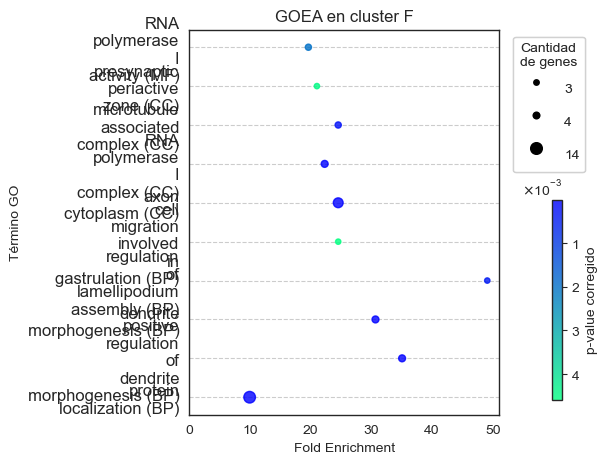

In [68]:
GOEA_plot(GOEA_result_F, gos_ws, (5, 5), 'GOEA en cluster F', size = 3)

In [69]:
gos_sienna = ['GO:0007042', 'GO:0070072', 'GO:0046034', 'GO:0051453', 'GO:0033179',
             'GO:0033180', 'GO:0046961']

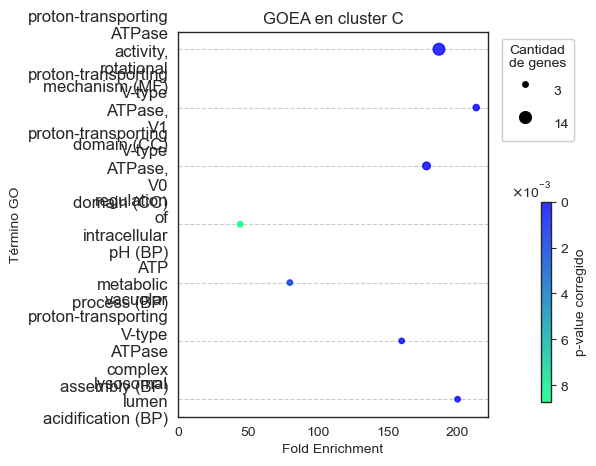

In [70]:
GOEA_plot(GOEA_result_C, gos_sienna, (5, 5), 'GOEA en cluster C', size = 2)

In [72]:
gos_goldenrod = ['GO:0006457', 'GO:0051082', 'GO:0140662', 'GO:0016887', 'GO:0005832']

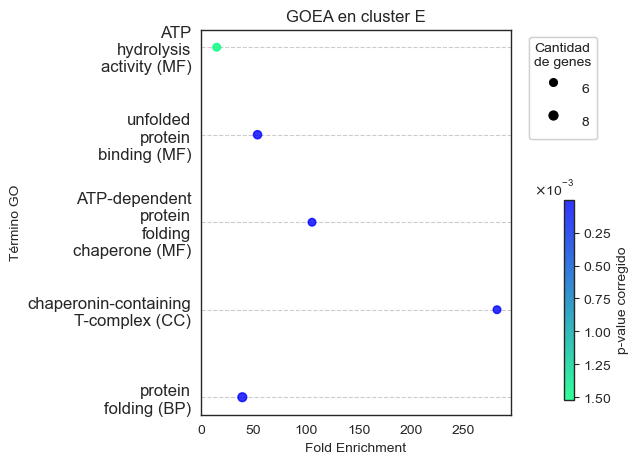

In [73]:
GOEA_plot(GOEA_result_E, gos_goldenrod, (5, 5), 'GOEA en cluster E', size = 2)

In [74]:
gos_darkseagreen = ['GO:0005737']

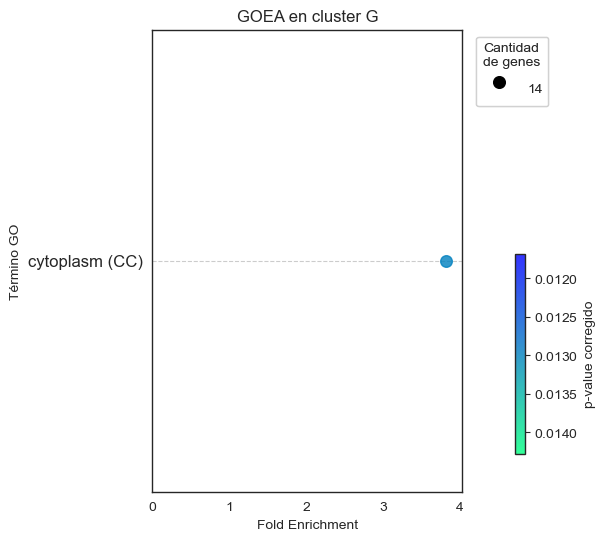

In [75]:
GOEA_plot(GOEA_result_G, gos_darkseagreen, (5, 6), 'GOEA en cluster G', size = 1)